In [7]:
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import urllib
from wordcloud import WordCloud
import tqdm

In [8]:
# data_regions = ["CA", "DE", "FR", "GB", "IN", "JP", "KR", "MX", "RU", "US"]
data_regions = ["CA", "DE", "FR", "GB", "IN", "RU", "US"]
data_types = ["_category_id.json", "videos.csv"]
data_dir = "./data/"
img_dir = "./img_temp/"
cur_dir = os.getcwd()
columns = ["video_id", "title", "description", "tags", "category_id", "channel_title",
           "publish_time", "trending_date", "views", "likes", "dislikes", "comment_count",
           "comments_disabled", "ratings_disabled", "video_error_or_removed", "thumbnail_link"]

In [9]:
def collect_categories():
    global categories
    categories = {}
    for region in data_regions:
        with open(data_dir + region + data_types[0]) as file:
            cats = json.loads(file.read())
        for item in cats["items"]:
            k, v = int(item["id"]), item["snippet"]["title"]
            if k in categories and categories[k] != v:
                print("ERROR: Category: " + str(k) + ", values: " + categories[k] + " and " + v)
            categories[k] = v

In [10]:
def convert_tag(tag_str: str) -> set[str]:
    if tag_str == "[none]":
        return None

    result = list()
    for tag in tag_str.split("|"):
        tag = tag.lower().strip("\"")
        result.append("_".join(tag.split(" ")))

    return result if result else None

def read_data(region):
    print(region)
    str_region = region
    
    if isinstance(region, int):
        str_region = data_regions[region]
   
    videos = pd.read_csv(data_dir + str_region + data_types[1],
                         parse_dates=["publish_time"])[columns]
    
    videos.trending_date = pd.to_datetime(videos.trending_date, format="%y.%d.%m")
    videos.insert(7, "publish_date", pd.to_datetime(videos['publish_time'].dt.date))
    videos.insert(8, "day_to_trending", videos.trending_date - videos.publish_date)
    videos.day_to_trending = videos.day_to_trending.apply(lambda date: date.days)

    uniq = videos.category_id.apply(lambda x: x if x not in categories else -1).unique()
    
    if len(uniq) == 1:
        videos.category_id = videos.apply(lambda x: categories[x.category_id], axis=1)
    else:
        print("ERROR: No category with ids " + str(uniq))

    videos["tags"] = videos.apply(lambda row: convert_tag(row["tags"]), axis = 1)
    videos["country"] = region
    
    return videos[videos.video_id != "#NAME?"]

In [11]:
collect_categories()
videos = {reg: read_data(reg) for reg in data_regions}

CA
DE
FR
GB
IN
RU
US


In [12]:
all_videos = pd.concat(videos)
all_videos["counts"] = all_videos[["video_id", "trending_date"]].groupby("video_id").transform("count")
all_videos["min_day_to_trending"] = all_videos[["video_id", "day_to_trending"]].groupby("video_id").transform("min")
all_videos.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 279330 entries, ('CA', 0) to ('US', 40948)
Data columns (total 21 columns):
 #   Column                  Non-Null Count   Dtype              
---  ------                  --------------   -----              
 0   video_id                279330 non-null  object             
 1   title                   279330 non-null  object             
 2   description             269402 non-null  object             
 3   tags                    259770 non-null  object             
 4   category_id             279330 non-null  object             
 5   channel_title           279330 non-null  object             
 6   publish_time            279330 non-null  datetime64[ns, UTC]
 7   publish_date            279330 non-null  datetime64[ns]     
 8   day_to_trending         279330 non-null  int64              
 9   trending_date           279330 non-null  datetime64[ns]     
 10  views                   279330 non-null  int64              
 11  likes      

In [13]:
all_videos.head()

video_id                                              title  \
CA 0  n1WpP7iowLc         Eminem - Walk On Water (Audio) ft. Beyoncé   
   1  0dBIkQ4Mz1M                      PLUSH - Bad Unboxing Fan Mail   
   2  5qpjK5DgCt4  Racist Superman | Rudy Mancuso, King Bach & Le...   
   3  d380meD0W0M                           I Dare You: GOING BALD!?   
   4  2Vv-BfVoq4g        Ed Sheeran - Perfect (Official Music Video)   

                                            description  \
CA 0  Eminem's new track Walk on Water ft. Beyoncé i...   
   1  STill got a lot of packages. Probably will las...   
   2  WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...   
   3  I know it's been a while since we did this sho...   
   4  🎧: https://ad.gt/yt-perfect\n💰: https://atlant...   

                                                   tags    category_id  \
CA 0  [eminem, walk, on, water, aftermath/shady/inte...          Music   
   1  [plush, bad_unboxing, unboxing, fan_mail, idub...         Comedy   
   2  [racist_superman, rudy, mancuso, king, bach, r...         Comedy   
   3  [ryan, higa, higatv, nigahiga, i_dare_you, idy...  Entertainment   
   4  [edsheeran, ed_sheeran, acoustic, live, cover,...          Music   

     channel_title              publish_time publish_date  day_to_trending  \
CA 0    EminemVEVO 2017-11-10 17:00:03+00:00   2017-11-10                4   
   1     iDubbbzTV 2017-11-13 17:00:00+00:00   2017-11-13                1   
   2  Rudy Mancuso 2017-11-12 19:05:24+00:00   2017-11-12                2   
   3      nigahiga 2017-11-12 18:01:41+00:00   2017-11-12                2   
   4    Ed Sheeran 2017-11-09 11:04:14+00:00   2017-11-09                5   

     trending_date  ...    likes  dislikes  comment_count  comments_disabled  \
CA 0    2017-11-14  ...   787425     43420         125882              False   
   1    2017-11-14  ...   127794      1688          13030              False   
   2    2017-11-14  ...   146035      5339           8181              False   
   3    2017-11-14  ...   132239      1989          17518              False   
   4    2017-11-14  ...  1634130     21082          85067              False   

      ratings_disabled  video_error_or_removed  \
CA 0             False                   False   
   1             False                   False   
   2             False                   False   
   3             False                   False   
   4             False                   False   

                                      thumbnail_link country counts  \
CA 0  https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg      CA     25   
   1  https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg      CA      8   
   2  https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg      CA     12   
   3  https://i.ytimg.com/vi/d380meD0W0M/default.jpg      CA     13   
   4  https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg      CA     23   

      min_day_to_trending  
CA 0                    4  
   1                    1  
   2                    2  
   3                    2  
   4                    5  

[5 rows x 21 columns]

In [14]:
only_descriptions = all_videos[["video_id", "title", "description", "tags", "category_id", "channel_title", "views", "likes", "dislikes", "comment_count",
           "comments_disabled", "ratings_disabled", "counts", "min_day_to_trending"]].sort_values("views").copy()
only_descriptions = only_descriptions.drop_duplicates(subset=["video_id"], keep="last")

In [15]:
only_descriptions.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 126092 entries, ('RU', 20314) to ('GB', 28412)
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   video_id             126092 non-null  object
 1   title                126092 non-null  object
 2   description          119336 non-null  object
 3   tags                 114052 non-null  object
 4   category_id          126092 non-null  object
 5   channel_title        126092 non-null  object
 6   views                126092 non-null  int64 
 7   likes                126092 non-null  int64 
 8   dislikes             126092 non-null  int64 
 9   comment_count        126092 non-null  int64 
 10  comments_disabled    126092 non-null  bool  
 11  ratings_disabled     126092 non-null  bool  
 12  counts               126092 non-null  int64 
 13  min_day_to_trending  126092 non-null  int64 
dtypes: bool(2), int64(6), object(6)
memory usage: 13.7+ MB


In [16]:
only_descriptions.count()

video_id               126092
title                  126092
description            119336
tags                   114052
category_id            126092
channel_title          126092
views                  126092
likes                  126092
dislikes               126092
comment_count          126092
comments_disabled      126092
ratings_disabled       126092
counts                 126092
min_day_to_trending    126092
dtype: int64

Посмотрим доли видео без тегов или без описания

In [17]:
s = 1 - only_descriptions.count() / len(only_descriptions)
s[s != 0]

description    0.053580
tags           0.095486
dtype: float64

<AxesSubplot:>

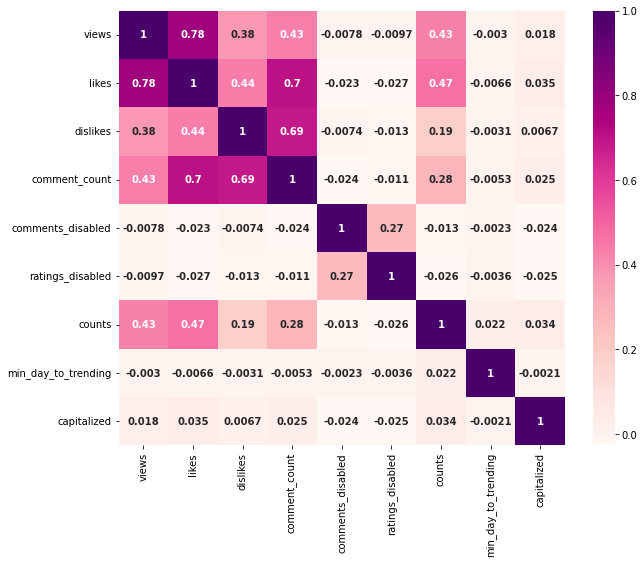

In [18]:
def capitalized(row) -> float:
    upper = 0
    if not isinstance(row, str):
        return 0

    for char in row:
        if char.isalpha():
            if char.isupper():
                upper += 1
    return upper / len(row)

only_descriptions["capitalized"] = only_descriptions["description"].apply(capitalized)


corr = only_descriptions.corr()
fig = plt.figure(figsize=(10, 8))
sns.heatmap(corr,
            xticklabels = corr.columns,
            yticklabels = corr.columns,
            annot = True,
            cmap="RdPu",
            annot_kws={"weight":"bold"})

Ожидаемо, большие буквы в описании никак на просмотры не влияют. Так же включение/отключение комментариев или рейтинга тоже не влияет на просмотры. Но видно некоторую корреляцию между просмотрами и частотой попадания в тренды.

Посмотрим, как влияет наличие тегов и описания на количество попаданий в тренды.

In [19]:
only_descriptions[only_descriptions.tags.isnull()].counts.describe()

count    12040.000000
mean         1.620017
std          2.471745
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         65.000000
Name: counts, dtype: float64

In [20]:
only_descriptions[only_descriptions.tags.notnull()].counts.describe()

count    114052.000000
mean          2.278128
std           3.768103
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          81.000000
Name: counts, dtype: float64

Видно, что видео с тегами больше раз попадают в тренды.

In [21]:
only_descriptions[only_descriptions.description.isnull()].counts.describe()

count    6756.000000
mean        1.460776
std         1.919960
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        70.000000
Name: counts, dtype: float64

In [22]:
only_descriptions[only_descriptions.description.notnull()].counts.describe()

count    119336.000000
mean          2.258003
std           3.739394
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          81.000000
Name: counts, dtype: float64

Аналогично и с описанием

In [23]:
only_descriptions[only_descriptions.tags.notnull() & only_descriptions.description.notnull()].counts.describe()

count    111293.000000
mean          2.295814
std           3.792967
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          81.000000
Name: counts, dtype: float64

In [24]:
only_descriptions[only_descriptions.tags.isnull() & only_descriptions.description.isnull()].counts.describe()

count    3997.000000
mean        1.389042
std         1.418281
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max        36.000000
Name: counts, dtype: float64

Если нет ни описания, ни тегов, то видео совсем мало будет в тренды попадать.

<AxesSubplot:>

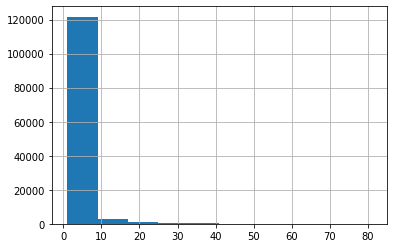

In [25]:
only_descriptions["counts"].hist()

In [26]:
only_descriptions.counts.describe()

count    126092.000000
mean          2.215287
std           3.669272
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          81.000000
Name: counts, dtype: float64

Посмотрим, как увеличивались просмотры у видео при попадании в тренды. Возьмём самое часто рекомендуемое видео.


In [27]:
most_recommended = all_videos[all_videos.video_id == only_descriptions[only_descriptions.counts == 81]["video_id"][0]]

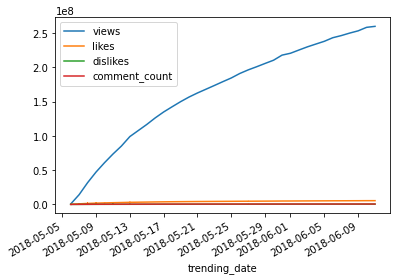

In [28]:
most_recommended.plot(x="trending_date", y=["views", "likes", "dislikes", "comment_count"])
>>> plt.show()

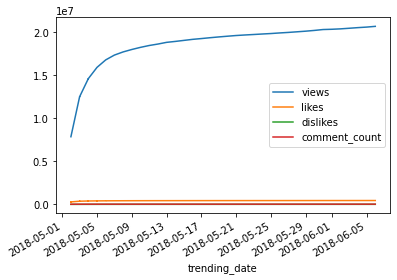

In [29]:
most_recommended = all_videos[all_videos.video_id == only_descriptions[only_descriptions.counts == 80]["video_id"][0]][["trending_date", "views", "likes", "dislikes", "comment_count"]]
most_recommended.plot(x="trending_date", y=["views", "likes", "dislikes", "comment_count"])
plt.show()

Графики похожи на логарифмические. Хотя, интуитивно, ожидался экспоненциальный или хотя бы линейный. Видимо, проблема "падающего возврата".

In [30]:
only_descriptions.min_day_to_trending.describe()


count    126092.000000
mean          4.221886
std          75.682237
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        4215.000000
Name: min_day_to_trending, dtype: float64

In [31]:
only_descriptions[only_descriptions.min_day_to_trending > 10].min_day_to_trending.describe()

count    1112.000000
mean      347.935252
std       728.491274
min        11.000000
25%        14.000000
50%        24.500000
75%       226.250000
max      4215.000000
Name: min_day_to_trending, dtype: float64

In [32]:
all_videos[["country", "min_day_to_trending"]].groupby("country").describe()

min_day_to_trending                                                   
                      count       mean         std  min  25%  50%  75%     max
country                                                                       
CA                  40881.0   2.806071   59.730584  0.0  1.0  1.0  1.0  3657.0
DE                  40840.0   1.458472   19.614609  0.0  1.0  1.0  1.0  2046.0
FR                  40724.0   2.461153   45.955955  0.0  1.0  1.0  1.0  3190.0
GB                  38916.0  27.043941  241.838117  0.0  1.0  1.0  2.0  3982.0
IN                  36841.0   1.194240    1.791523  0.0  1.0  1.0  1.0   220.0
RU                  40179.0   2.095299   28.224992  0.0  1.0  1.0  1.0  2416.0
US                  40949.0  12.011502  146.159826  0.0  1.0  1.0  2.0  4215.0

Интересно, что в Индии видео попадают в тренды быстрее, чем в других странах

In [33]:
only_descriptions[only_descriptions.tags.isnull()].min_day_to_trending.describe()

count    12040.000000
mean         4.968023
std         63.346925
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1848.000000
Name: min_day_to_trending, dtype: float64

In [34]:
only_descriptions[only_descriptions.tags.notnull()].min_day_to_trending.describe()

count    114052.000000
mean          4.143119
std          76.868816
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        4215.000000
Name: min_day_to_trending, dtype: float64

In [35]:
only_descriptions[only_descriptions.description.isnull()].min_day_to_trending.describe()

count    6756.000000
mean        6.384843
std        85.317715
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max      2820.000000
Name: min_day_to_trending, dtype: float64

In [36]:
only_descriptions[only_descriptions.description.notnull()].min_day_to_trending.describe()

count    119336.000000
mean          4.099434
std          75.098313
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        4215.000000
Name: min_day_to_trending, dtype: float64

In [37]:
only_descriptions[only_descriptions.tags.isnull() & only_descriptions.description.isnull()].min_day_to_trending.describe()

count    3997.000000
mean        5.509132
std        68.704396
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max      1699.000000
Name: min_day_to_trending, dtype: float64

In [38]:
only_descriptions[only_descriptions.tags.notnull() & only_descriptions.description.notnull()].min_day_to_trending.describe()

count    111293.000000
mean          4.056095
std          76.044217
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max        4215.000000
Name: min_day_to_trending, dtype: float64

Видно, что наличие тегов и комментариев помогает быстрее попасть в тренды

Построим облако тегов.

Для этого удалим все дубликаты и оставим только по одной записи для каждого видео.

Сначала по всем видео:


(-0.5, 999.5, 999.5, -0.5)

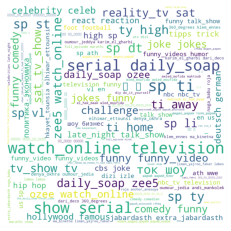

In [39]:
wordcloud = WordCloud(
    width = 1000, height = 1000, background_color ='white', min_font_size = 10
).generate(" ".join(
    only_descriptions[~only_descriptions.tags.isnull()].tags.explode()
))

plt.imshow(wordcloud)
plt.axis('off')

Теперь по странам

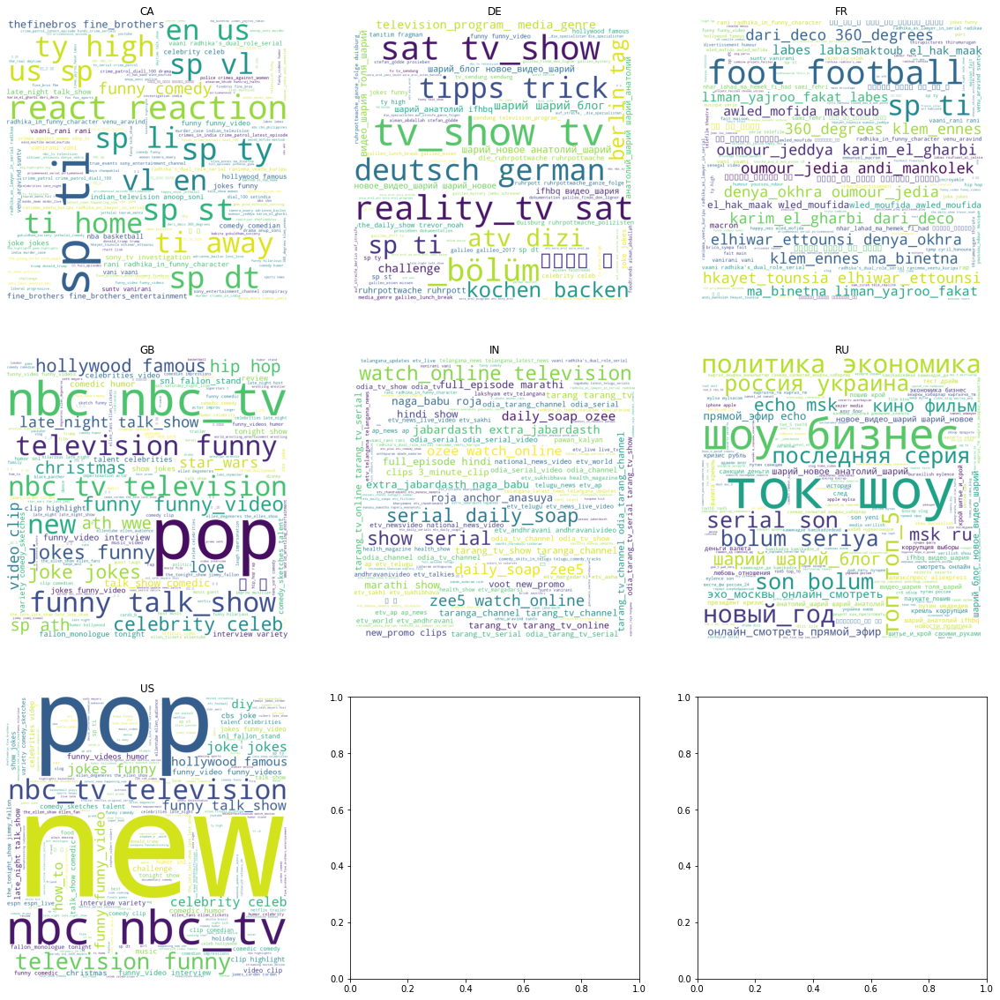

In [40]:
worlds_clouds = dict()

for region_name, data in videos.items():
    filtered = data[["video_id", "tags"]].drop_duplicates("video_id")
    worlds_clouds[region_name] = WordCloud(
        width = 1000, height = 1000, background_color ='white', min_font_size = 10
    ).generate(" ".join(
        filtered[filtered.tags.notnull()].tags.explode()
    ))

fig, axes = plt.subplots(3, 3, figsize=(20, 20))

for ax, img in zip(axes.ravel(), worlds_clouds.items()):
    ax.imshow(img[1])
    ax.axis('off')
    ax.set_title(img[0])

По категориям:

In [41]:
worlds_clouds = dict()

by_categories = all_videos[all_videos.tags.notnull()][["video_id", "category_id", "tags"]].drop_duplicates("video_id").groupby("category_id")

for category_name, data in by_categories:
    worlds_clouds[category_name] = WordCloud(
        width = 1000, height = 1000, background_color ='white', min_font_size = 10
    ).generate(" ".join(
       data.tags.explode()
    ))



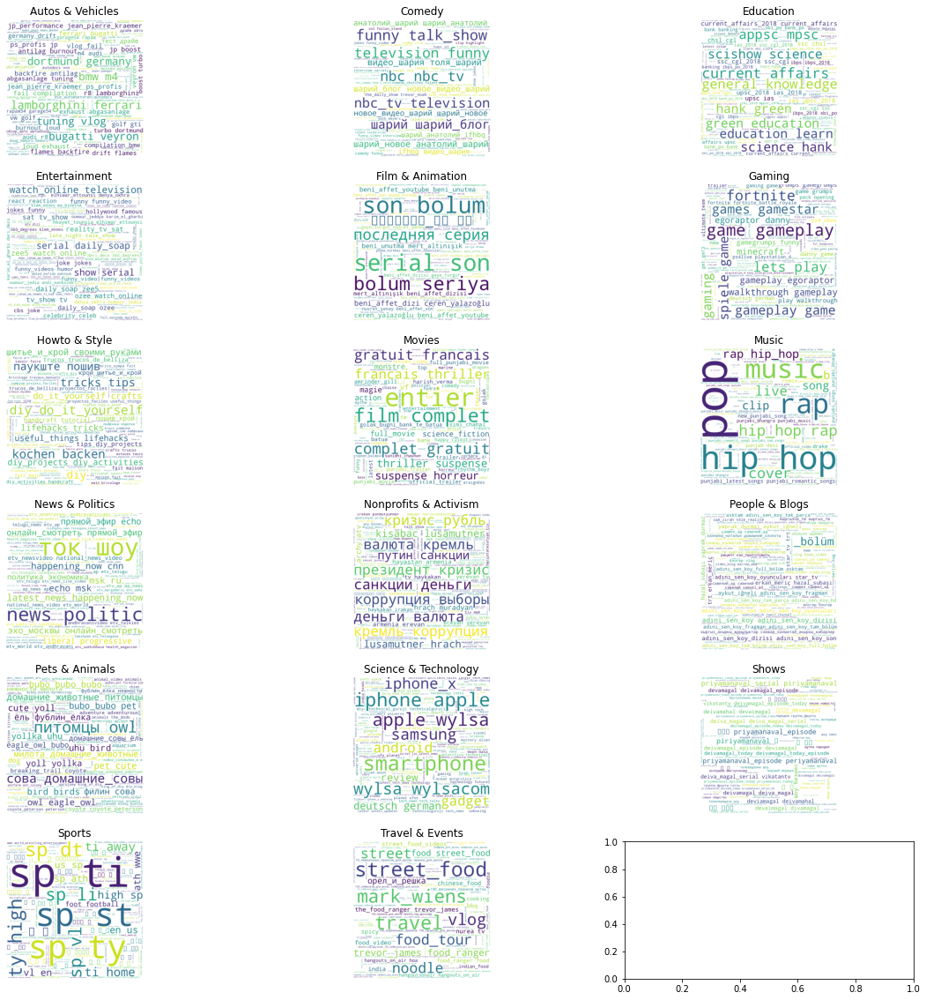

In [42]:
fig, axes = plt.subplots(len(by_categories) // 3 + 1, 3, figsize=(20, 20))

for ax, img in zip(axes.ravel(), worlds_clouds.items()):
    ax.imshow(img[1])
    ax.axis('off')
    ax.set_title(img[0])

Теперь по странам и категориям:

In [43]:
worlds_clouds = dict()

for region_name, data in videos.items():
    by_categories = data[data.tags.notnull()][["video_id", "category_id", "tags"]].drop_duplicates("video_id").groupby("category_id")

    for category_name, data in by_categories:
        worlds_clouds[f"{region_name}:{category_name}"] = WordCloud(
            width = 1000, height = 1000, background_color ='white', min_font_size = 10
        ).generate(" ".join(
            data.tags.explode()
        ))

In [44]:
fig, axes = plt.subplots(len(worlds_clouds) // 3 + 1, 3, figsize=(200, 200))

for ax, img in zip(axes.ravel(), worlds_clouds.items()):
    ax.imshow(img[1])
    ax.axis('off')
    ax.set_title(img[0])